In [ ]:
import fnmatch
import pandas as pd
import numpy as np
import random
from sklearn.metrics import accuracy_score
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from image_processing import *

In [ ]:
# # This is my local dir. change to yours :)
# dir_path = '/Users/khangdao/Desktop/Project DS/Random_series'

# # List all folders in the directory
# path_list = [f.path for f in os.scandir(dir_path) if f.is_dir()]

# # Print the list of folders
# # print(path_list)

# images = []
# for path in path_list:
#     # path = './Random_series_001'
#     data = pd.read_csv(f'{path}/image_data.csv')
#     df = pd.DataFrame(data)
#     boundary = pd.DataFrame()
#     df = df.drop(['BaS', 'Sn2BaS3', 'SnS', 'BaS_thickness_cm', 'Sn2BaS3_thickness_cm', 'SnS_thickness_cm'], axis=1)

#     # Find the .tif file named Filtered_R_Image in the same directory
#     for file in os.listdir(path):
#         if file == "Filtered_t_Image.tif":
#             # Open the .tif file
#             image = Image.open(os.path.join(path, file))
#             # Append the image to the images list
#             images.append(image)

#     with open(f'{path}/settings.json', 'r') as f:
#         settings = json.load(f)
    
#     boundary1 = settings['boundaries'][1]
#     boundary2 = settings['boundaries'][2]
#     if 'boundaries' in settings and len(settings['boundaries']) > 2:
#         boundary = pd.DataFrame({
#         'boundary1': [boundary1],
#         'boundary2': [boundary2]
#     })
#     else:
#         raise ValueError("Settings do not contain valid boundaries.")
#     df['target'] = df['F'].apply(lambda x: 1 if x < boundary1 else 2 if boundary1 <= x <= boundary2 else 3)

#     boundary.to_csv(f'{path}/boundary.csv', index=False)
#     df.to_csv(f'{path}/image_data_1.csv', index=False)

# print(df.head())
# print(settings['boundaries'])


# train_directories = path_list[:100]
# val_directories = path_list[100:150]
# test_directories = path_list[150:]

# print(train_directories)
# print(val_directories)
# print(test_directories)

# train_images_T_list, train_images_R_list, train_enhanced_images_T_list, train_enhanced_images_R_list, train_df_list, train_boundary_list = combine_data_and_images(train_directories, 'train')
# val_images_T_list, val_images_R_list, val_enhanced_images_T_list, val_enhanced_images_R_list, val_df_list, val_boundary_list = combine_data_and_images(val_directories, 'val')
# test_images_T_list, test_images_R_list, test_enhanced_images_T_list, test_enhanced_images_R_list, test_df_list, test_boundary_list = combine_data_and_images(test_directories, 'test')

In [ ]:
# Load data from the saved list
# Run the previous cell on your local computer instead
train_images_T_list, train_images_R_list, train_enhanced_images_T_list, train_enhanced_images_R_list, train_df_list, train_boundary_list = load_data_and_images('train')
val_images_T_list, val_images_R_list, val_enhanced_images_T_list, val_enhanced_images_R_list, val_df_list, val_boundary_list = load_data_and_images('val')
test_images_T_list, test_images_R_list, test_enhanced_images_T_list, test_enhanced_images_R_list, test_df_list, test_boundary_list = load_data_and_images('test')

In [4]:
# Extracting target values from DataFrames
train_target_list = [train_df_list[i]['target'].values for i in range(len(train_df_list))]
val_target_list = [val_df_list[i]['target'].values for i in range(len(val_df_list))]
test_target_list = [test_df_list[i]['target'].values for i in range(len(test_df_list))]

In [5]:
# Combined function to apply scaling and processing of the DataFrame
def transform_and_process_dataframe(df):
    """
    Transforms and processes a DataFrame by scaling, reindexing, and filling missing values.
    
    Steps:
    1. Scale the 'Sn' and 'Ba' columns to create new columns 'Sn_new' and 'Ba_new'.
    2. Select and retain relevant columns for further processing.
    3. Create all combinations of unique 'x' and 'y' values to ensure a complete grid.
    4. Reindex the DataFrame to include all combinations of 'x' and 'y'.
    5. Fill missing values in the 'target' column with 0.
    6. Fill missing values in other columns with 1.
    
    Parameters:
    df (pd.DataFrame): Input DataFrame with required columns 'x', 'y', 'Sn', 'Ba', 'F', and 'target'.
    
    Returns:
    pd.DataFrame: Transformed and processed DataFrame ready for image generation.
    """
    # Step 1: Scale 'Sn' and 'Ba' by multiplying by 10^6, creating new columns for scaled values.
    df['Sn_new'] = df['Sn'] * 10**6
    df['Ba_new'] = df['Ba'] * 10**6
    
    # Step 2: Select only the relevant columns required for further processing.
    # This removes unnecessary data and ensures consistency.
    df = df[['x', 'y', 'Sn_new', 'Ba_new', 'F', 'target']]
    
    # Step 3: Create a complete grid of unique 'x' and 'y' combinations using a MultiIndex.
    # This ensures that all possible points in the 2D space are represented, even if they are not present in the data.
    all_combinations = pd.MultiIndex.from_product([df['x'].unique(), df['y'].unique()], names=['x', 'y'])
    
    # Step 4: Reindex the DataFrame to include the complete grid and reset the index for clarity.
    # Missing points will have NaN values for all columns initially.
    df = df.set_index(['x', 'y']).reindex(all_combinations).reset_index()
    
    # Step 5: Fill missing values in the 'target' column with 0.
    # This is critical for classification tasks, where missing target values imply no activity.
    df['target'] = df['target'].fillna(0)
    
    # Step 6: Fill missing values in other columns ('Sn_new', 'Ba_new', 'F') with 1.
    # This assumes that missing feature values should default to 1 for consistent processing.
    df[df.columns.difference(['x', 'y', 'target'])] = df[df.columns.difference(['x', 'y', 'target'])].fillna(1)
    
    # Return the fully transformed and processed DataFrame.
    return df

# Apply the combined function to all DataFrames in the training, validation, and testing lists.
train_df_list_new = [transform_and_process_dataframe(df) for df in train_df_list]  # Process training DataFrames
val_df_list_new = [transform_and_process_dataframe(df) for df in val_df_list]      # Process validation DataFrames
test_df_list_new = [transform_and_process_dataframe(df) for df in test_df_list]    # Process test DataFrames


In [6]:
train_df_list_new[0]

,x,y,Sn_new,Ba_new,F,target
0,-2.49,-0.49,0.306285,0.223357,0.578287,2.0
1,-2.49,-0.44,0.305339,0.222558,0.578407,2.0
2,-2.49,-0.39,0.304387,0.221750,0.578532,2.0
3,-2.49,-0.34,0.303428,0.220935,0.578660,2.0
4,-2.49,-0.29,0.302462,0.220112,0.578793,2.0
...,...,...,...,...,...,...
10196,2.51,2.41,1.000000,1.000000,1.000000,0.0
10197,2.51,-2.44,1.000000,1.000000,1.000000,0.0
10198,2.51,2.46,1.000000,1.000000,1.000000,0.0
10199,2.51,-2.49,1.000000,1.000000,1.000000,0.0


In [7]:
import cv2  # For image processing

# Function to process each DataFrame and generate resized images
def process_dataframe_to_image(df_complete):
    """
    Converts a DataFrame containing spatial and feature data into a 101x101 image with 3 channels.
    
    Parameters:
    df_complete (pd.DataFrame): DataFrame with columns 'x', 'y', 'Sn_new', 'Ba_new', 'F'.
    
    Returns:
    np.ndarray: A 3D array (101x101x3) where each channel corresponds to Sn_new, Ba_new, and F.
    """

    # Step 1: Sort the unique values of x and y to create a mapping for grid indices.
    x_unique_sorted = np.sort(np.unique(df_complete['x'].values))  # Sort unique x-coordinates
    y_unique_sorted = np.sort(np.unique(df_complete['y'].values))  # Sort unique y-coordinates

    # Step 2: Create a mapping from the sorted unique values of x and y to grid indices.
    # This allows us to assign data points to specific positions in the (101, 101) grid.
    x_map = {x_val: idx for idx, x_val in enumerate(x_unique_sorted)}  # Map x values to indices
    y_map = {y_val: idx for idx, y_val in enumerate(y_unique_sorted)}  # Map y values to indices

    # Step 3: Initialize an empty 3D array of shape (101, 101, 3) to represent the RGB image.
    # The 3 channels correspond to Sn, Ba, and F values.
    array_img_resized_101x101_filled = np.zeros((101, 101, 3))  # Initialize with zeros

    # Step 4: Populate the image array using data from the DataFrame.
    for _, row in df_complete.iterrows():
        # Get the corresponding grid indices for the (x, y) coordinates.
        x_idx = x_map[row['x']]  # Map the x-coordinate to the grid index
        y_idx = y_map[row['y']]  # Map the y-coordinate to the grid index

        # Assign the values of Sn_new, Ba_new, and F to the respective channels.
        # These channels correspond to Red, Green, and Blue in the RGB image.
        array_img_resized_101x101_filled[y_idx, x_idx, 0] = row['Sn_new']*255  # Red channel (Sn)
        array_img_resized_101x101_filled[y_idx, x_idx, 1] = row['Ba_new']*255  # Green channel (Ba)
        array_img_resized_101x101_filled[y_idx, x_idx, 2] = row['F']*255       # Blue channel (F)

    # Step 5: Return the constructed image array.
    return array_img_resized_101x101_filled

# Apply the function to each DataFrame in the train, validation, and test lists.
# Each DataFrame is converted into a 101x101 image.
train_images = [process_dataframe_to_image(df) for df in train_df_list_new]  # Process training DataFrames
val_images = [process_dataframe_to_image(df) for df in val_df_list_new]      # Process validation DataFrames
test_images = [process_dataframe_to_image(df) for df in test_df_list_new]    # Process test DataFrames

# Now `train_images`, `val_images`, and `test_images` contain the processed images

In [8]:
train_images[0]

array([[[255., 255., 255.],
        [255., 255., 255.],
        [255., 255., 255.],
        ...,
        [255., 255., 255.],
        [255., 255., 255.],
        [255., 255., 255.]],

       [[255., 255., 255.],
        [255., 255., 255.],
        [255., 255., 255.],
        ...,
        [255., 255., 255.],
        [255., 255., 255.],
        [255., 255., 255.]],

       [[255., 255., 255.],
        [255., 255., 255.],
        [255., 255., 255.],
        ...,
        [255., 255., 255.],
        [255., 255., 255.],
        [255., 255., 255.]],

       ...,

       [[255., 255., 255.],
        [255., 255., 255.],
        [255., 255., 255.],
        ...,
        [255., 255., 255.],
        [255., 255., 255.],
        [255., 255., 255.]],

       [[255., 255., 255.],
        [255., 255., 255.],
        [255., 255., 255.],
        ...,
        [255., 255., 255.],
        [255., 255., 255.],
        [255., 255., 255.]],

       [[255., 255., 255.],
        [255., 255., 255.],
        [255., 2

In [9]:
import os
import tifffile as tiff  # Library for handling TIF files

# Directory to save the TIF images
output_dir = "DF_TIF"
os.makedirs(output_dir, exist_ok=True)  # Create the directory if it doesn't exist

# Function to save images from a list as TIF files
def save_images_as_tif(image_list, output_directory, prefix="train_image"):
    """
    Saves images from a list of NumPy arrays as TIF files to the specified directory.

    Parameters:
    image_list (list): List of images (as NumPy arrays) to save.
    output_directory (str): Directory to save the TIF images.
    prefix (str): Prefix for the filenames.
    """
    for i, img in enumerate(image_list):
        # Generate the filename
        filename = os.path.join(output_directory, f"{prefix}_{i + 1}.tif")
        
        # Save the image as a TIF file using tifffile
        tiff.imwrite(filename, img.astype(np.uint8))  # Ensure data is in uint8 format
        
        print(f"Saved {filename}")

# Save the train images as TIF files
save_images_as_tif(train_images, output_dir)

print(f"Train images saved as TIF files in '{output_dir}'.")


Saved DF_TIF/train_image_1.tif
Saved DF_TIF/train_image_2.tif
Saved DF_TIF/train_image_3.tif
Saved DF_TIF/train_image_4.tif
Saved DF_TIF/train_image_5.tif
Saved DF_TIF/train_image_6.tif
Saved DF_TIF/train_image_7.tif
Saved DF_TIF/train_image_8.tif
Saved DF_TIF/train_image_9.tif
Saved DF_TIF/train_image_10.tif
Saved DF_TIF/train_image_11.tif
Saved DF_TIF/train_image_12.tif
Saved DF_TIF/train_image_13.tif
Saved DF_TIF/train_image_14.tif
Saved DF_TIF/train_image_15.tif
Saved DF_TIF/train_image_16.tif
Saved DF_TIF/train_image_17.tif
Saved DF_TIF/train_image_18.tif
Saved DF_TIF/train_image_19.tif
Saved DF_TIF/train_image_20.tif
Saved DF_TIF/train_image_21.tif
Saved DF_TIF/train_image_22.tif
Saved DF_TIF/train_image_23.tif
Saved DF_TIF/train_image_24.tif
Saved DF_TIF/train_image_25.tif
Saved DF_TIF/train_image_26.tif
Saved DF_TIF/train_image_27.tif
Saved DF_TIF/train_image_28.tif
Saved DF_TIF/train_image_29.tif
Saved DF_TIF/train_image_30.tif
Saved DF_TIF/train_image_31.tif
Saved DF_TIF/trai

In [10]:
# Helper function to resize images
def resize_images(img_list):
    """
    Resizes a list of images to 101x101 using linear interpolation.

    Parameters:
    img_list (list): List of images (as NumPy arrays).

    Returns:
    list: List of resized images.
    """
    resized_list = []
    for img in img_list:
        resized_img = cv2.resize(np.array(img), (101, 101), interpolation=cv2.INTER_LINEAR)
        resized_list.append(resized_img)
    return resized_list

# Resize all image lists
train_enhanced_images_T_resized_list = resize_images(train_enhanced_images_T_list)
train_enhanced_images_R_resized_list = resize_images(train_enhanced_images_R_list)
val_enhanced_images_T_resized_list = resize_images(val_enhanced_images_T_list)
val_enhanced_images_R_resized_list = resize_images(val_enhanced_images_R_list)
test_enhanced_images_T_resized_list = resize_images(test_enhanced_images_T_list)
test_enhanced_images_R_resized_list = resize_images(test_enhanced_images_R_list)


In [11]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, Input, Concatenate, Reshape, TimeDistributed, BatchNormalization
from tensorflow.keras.callbacks import ReduceLROnPlateau

# Ensure reproducibility of random operations
random.seed(17)  # For random number generation reproducibility

# Shape of the input images (height, width, and number of channels)
image_height, image_width, image_channels = 101, 101, 3

# Combine the images along the channel dimension
def combine_images(img_list_T, img_list_R, df_list):
    """
    Combines two image lists and a DataFrame list along the channel dimension.

    Parameters:
    img_list_T (list): List of transformed images (e.g., enhanced T images).
    img_list_R (list): List of reference images (e.g., enhanced R images).
    df_list (list): List of data containing additional features.

    Returns:
    np.ndarray: Combined image data with an additional channel for each input.
    """
    combined = []
    for img_T, img_R, df in zip(img_list_T, img_list_R, df_list):
        combined.append(np.concatenate((img_T, img_R, df), axis=-1))  # Combine along the last axis (channels)
    return np.array(combined)

# Normalize the images and combine them
# Each combined image will have 9 channels: 3 for img_T, 3 for img_R, and 3 from df
train_images_combined = combine_images(train_enhanced_images_T_resized_list, train_enhanced_images_R_resized_list, train_images) / 255.0
val_images_combined = combine_images(val_enhanced_images_T_resized_list, val_enhanced_images_R_resized_list, val_images) / 255.0
test_images_combined = combine_images(test_enhanced_images_T_resized_list, test_enhanced_images_R_resized_list, test_images) / 255.0

# Assuming the target lists are already prepared
train_target_array_list = np.array(train_target_list)  # Target shape: (num_samples, 8092)
val_target_array_list = np.array(val_target_list)      # Validation targets
test_target_array_list = np.array(test_target_list)    # Test targets

# Define the input for the combined image set
input_combined = Input(shape=(image_height, image_width, 9), name='input_combined')

# Define a function to create the CNN layers
def create_cnn_layers(input_layer):
    """
    Creates convolutional layers for feature extraction.

    Parameters:
    input_layer (tf.Tensor): Input tensor for the CNN.

    Returns:
    tf.Tensor: Output tensor after applying convolutional, pooling, and batch normalization layers.
    """
    # First convolutional block
    x = Conv2D(64, (3, 3), activation='relu')(input_layer)  # 64 filters, 3x3 kernel
    x = BatchNormalization()(x)  # Normalize after activation
    x = MaxPooling2D((2, 2))(x)  # Down-sample by 2x2

    # Second convolutional block
    x = Conv2D(128, (3, 3), activation='relu')(x)
    x = BatchNormalization()(x)
    x = MaxPooling2D((2, 2))(x)

    # Third convolutional block
    x = Conv2D(256, (3, 3), activation='relu')(x)
    x = BatchNormalization()(x)
    x = MaxPooling2D((2, 2))(x)

    # Fourth convolutional block
    x = Conv2D(512, (3, 3), activation='relu')(x)
    x = BatchNormalization()(x)
    x = MaxPooling2D((2, 2))(x)

    # Fifth convolutional block
    x = Conv2D(1024, (3, 3), activation='relu')(x)
    x = BatchNormalization()(x)
    x = MaxPooling2D((2, 2))(x)

    # Flatten the output for the fully connected layers
    x = Flatten()(x)
    return x

# Process the combined input through the CNN layers
x_combined = create_cnn_layers(input_combined)

# Add fully connected layers
fc = Dense(256, activation='relu')(x_combined)  # Dense layer with 256 units
fc = Dropout(0.5)(fc)  # Dropout to prevent overfitting
fc = Dense(8092 * 3, activation='relu')(fc)  # Output size matches 8092 time steps and 3 classes
fc = Reshape((8092, 3))(fc)  # Reshape the output to (batch_size, 8092, 3)

# Apply softmax activation to each time step using TimeDistributed
output = TimeDistributed(Dense(3, activation='softmax'))(fc)

# Define the model
model = Model(inputs=input_combined, outputs=output)

# Compile the model with Adam optimizer and sparse categorical crossentropy loss
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Print the model architecture
model.summary()

# Adjust target labels to be zero-based
# Subtracting 1 from the labels to map them into the range [0, num_classes - 1]
train_target_array_list = np.array(train_target_list) - 1
val_target_array_list = np.array(val_target_list) - 1
test_target_array_list = np.array(test_target_list) - 1

# Define a learning rate scheduler to reduce learning rate on plateau
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',    # Monitors the validation loss
    factor=0.5,            # Reduce learning rate by half if no improvement
    patience=3,            # Wait for 3 epochs before reducing learning rate
    min_lr=1e-6            # Minimum learning rate to prevent it from going too low
)

# Train the model
history = model.fit(
    train_images_combined,  # Training images
    train_target_array_list,  # Corresponding labels
    validation_data=(val_images_combined, val_target_array_list),  # Validation data
    epochs=100,             # Train for 100 epochs
    batch_size=8,           # Use a batch size of 8
    callbacks=[reduce_lr]   # Include the learning rate scheduler callback
)


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_combined (InputLayer)     │ (None, 101, 101, 9)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 99, 99, 64)     │         5,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 99, 99, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 49, 49, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 47, 47, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 47, 47, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 23, 23, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 21, 21, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 21, 21, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 10, 10, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 8, 8, 512)      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 8, 8, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 2, 2, 1024)     │     4,719,616 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 2, 2, 1024)     │         4,096 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 1, 1, 1024)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       262,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 24276)          │     6,238,932 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 8092, 3)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed                │ (None, 8092, 3)        │            12 │
│ (TimeDistributed)               │                        │             

 Total params: 12,783,328 (48.76 MB)

 Trainable params: 12,779,360 (48.75 MB)

 Non-trainable params: 3,968 (15.50 KB)

Epoch 1/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 415s 9s/step - accuracy: 0.3706 - loss: 1.0865 - val_accuracy: 0.4638 - val_loss: 1.0650 - learning_rate: 0.0010
Epoch 2/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 42s 3s/step - accuracy: 0.4673 - loss: 1.0130 - val_accuracy: 0.5404 - val_loss: 1.0795 - learning_rate: 0.0010
Epoch 3/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 41s 3s/step - accuracy: 0.5817 - loss: 0.9218 - val_accuracy: 0.4481 - val_loss: 1.0227 - learning_rate: 0.0010
Epoch 4/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 47s 4s/step - accuracy: 0.5824 - loss: 0.9256 - val_accuracy: 0.4637 - val_loss: 1.0280 - learning_rate: 0.0010
Epoch 5/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 42s 3s/step - accuracy: 0.6338 - loss: 0.8768 - val_accuracy: 0.3643 - val_loss: 1.2273 - learning_rate: 0.0010
Epoch 6/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 39s 3s/step - accuracy: 0.6514 - loss: 0.8435 - val_accuracy: 0.4084 - val_loss: 1.3115 - learning_rate: 0.0010
Epoch 7/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 41s 3s/step - accuracy: 0.6470 - loss: 0.8544 - val_ac

In [12]:
# Make predictions on the combined test data (9 channels)
test_pred = model.predict(test_images_combined)

# Make prediction based on max probability
test_pred_labels = np.argmax(test_pred, axis=-1)

# Ensure the model's input signature is correct
test_loss, test_accuracy = model.evaluate(
    test_images_combined,  # Provide both inputs as a list
    test_target_array_list  # Provide target labels
)

# Print the test loss and test accuracy
print(f'Test Loss: {test_loss}')
print(f'Test Accuracy: {test_accuracy * 100:.2f}%')

2/2 ━━━━━━━━━━━━━━━━━━━━ 109s 52s/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - accuracy: 0.9191 - loss: 0.4311
Test Loss: 0.41795578598976135
Test Accuracy: 91.97%


In [18]:
for i in range(50):
    test_df_list[i]['target_pred'] = test_pred_labels[i]

In [19]:
test_df_list[0]

,x,y,Sn,Ba,F,target,Sn_new,Ba_new,target_pred,target_encoded_true,target_encoded_pred
0,-2.49,-0.49,3.294041e-07,2.957413e-07,0.526924,1,0.329404,0.295741,0,0,0
1,-2.49,-0.44,3.283515e-07,2.946957e-07,0.527009,1,0.328352,0.294696,0,0,0
2,-2.49,-0.39,3.272907e-07,2.936398e-07,0.527097,1,0.327291,0.293640,0,0,0
3,-2.49,-0.34,3.262217e-07,2.925737e-07,0.527188,1,0.326222,0.292574,0,0,0
4,-2.49,-0.29,3.251447e-07,2.914977e-07,0.527282,1,0.325145,0.291498,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
8087,2.51,0.16,5.881726e-07,1.466711e-07,0.800405,3,0.588173,0.146671,2,2,2
8088,2.51,0.21,5.849849e-07,1.462733e-07,0.799970,3,0.584985,0.146273,2,2,2
8089,2.51,0.26,5.817908e-07,1.458717e-07,0.799534,3,0.581791,0.145872,2,2,2
8090,2.51,0.31,5.785910e-07,1.454666e-07,0.799095,3,0.578591,0.145467,2,2,2


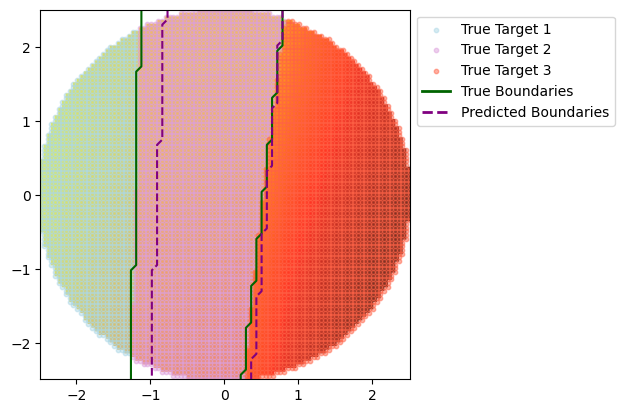

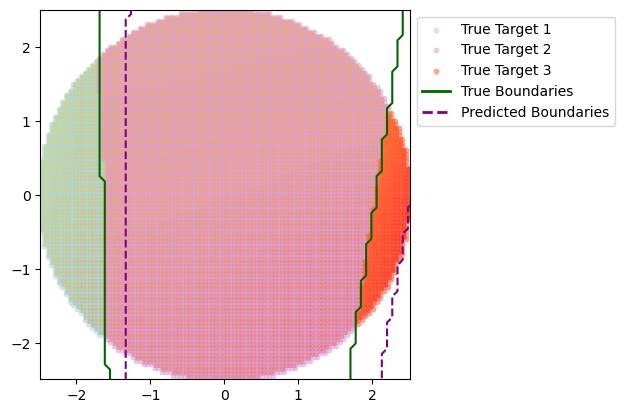

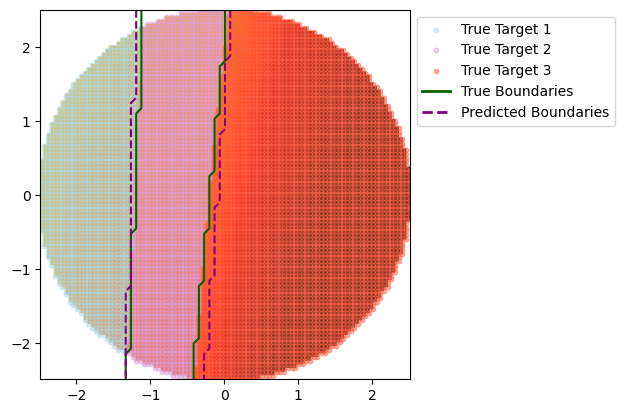

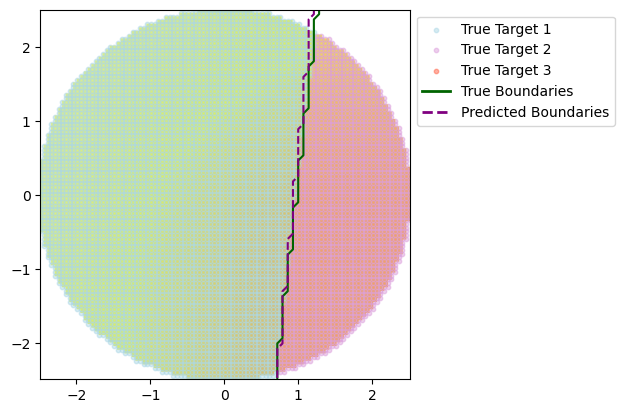

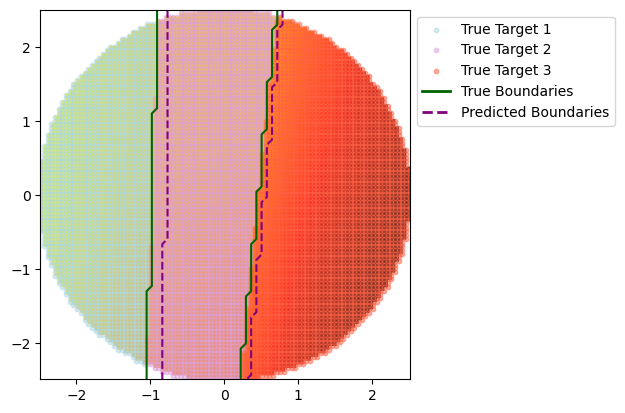

...

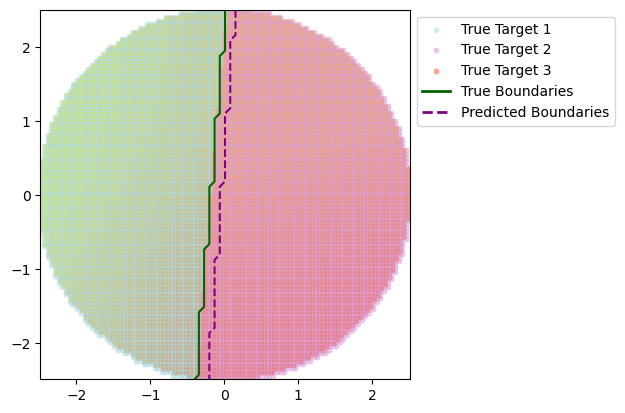

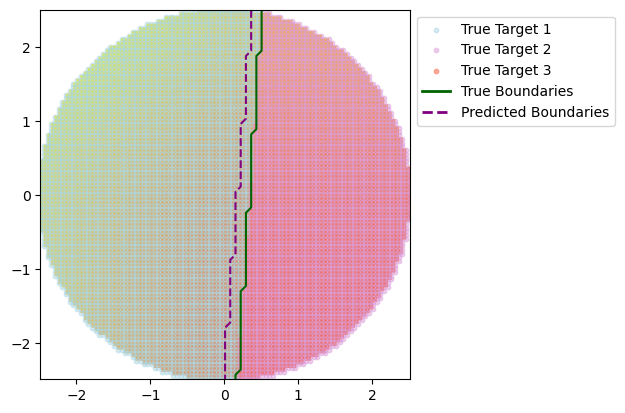

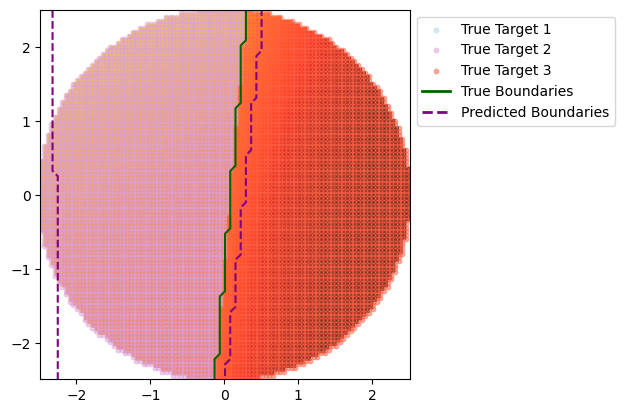

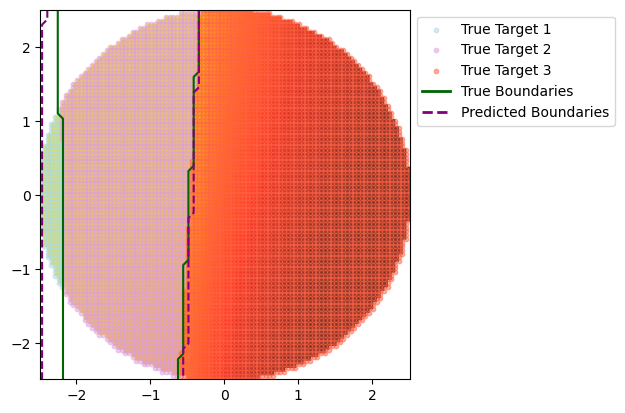

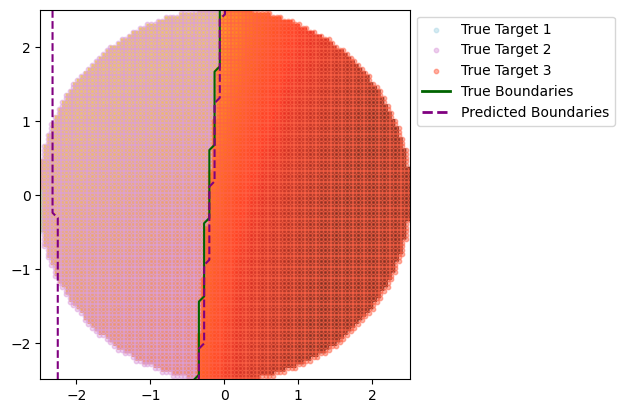

In [16]:
for i in range(50):
    plot_combined_targets_on_image(test_df_list[i], test_enhanced_images_T_list[i]) 

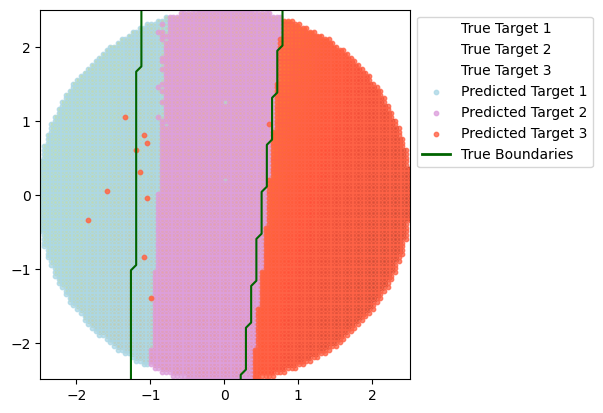

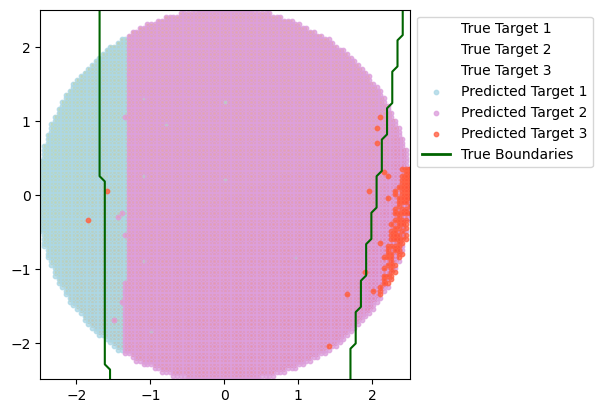

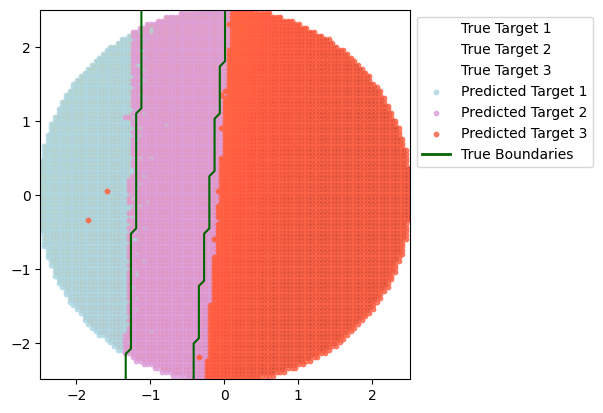

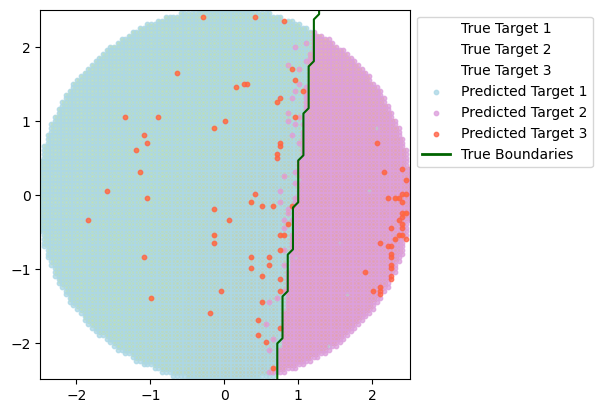

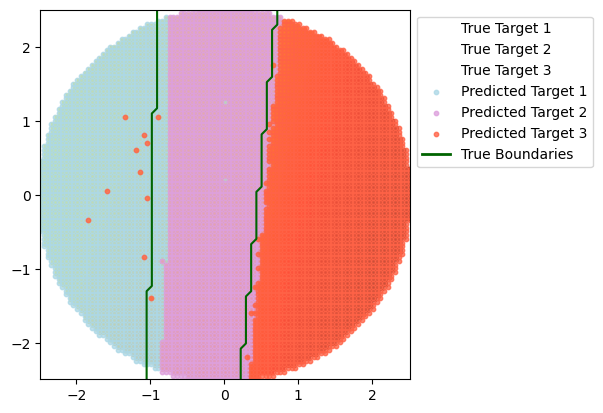

...

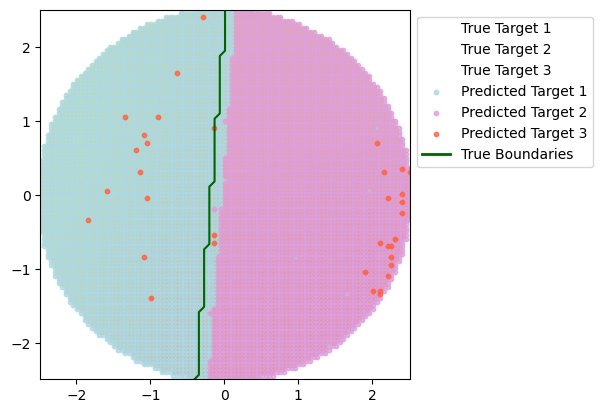

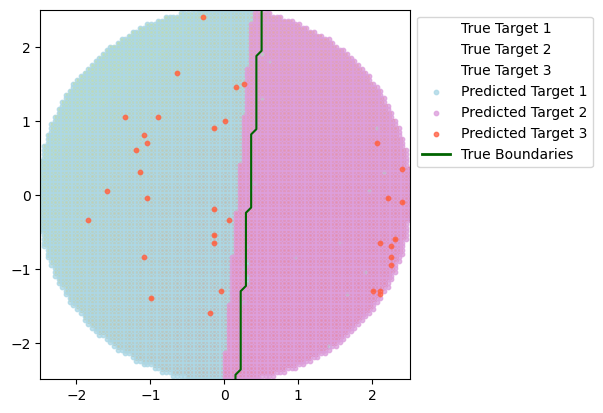

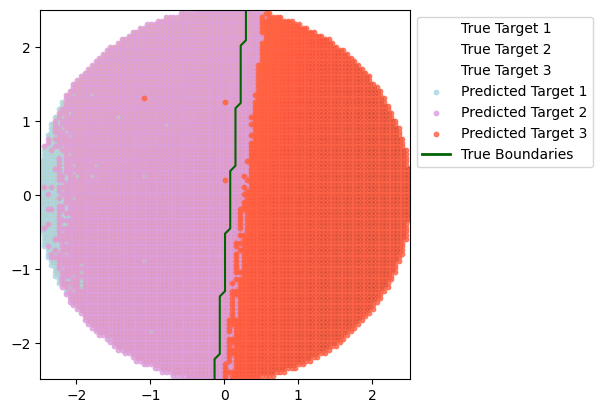

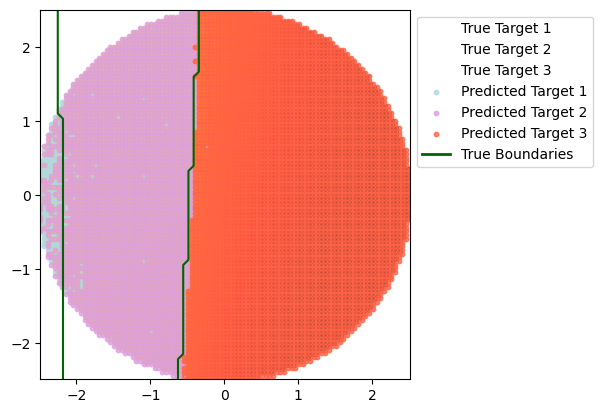

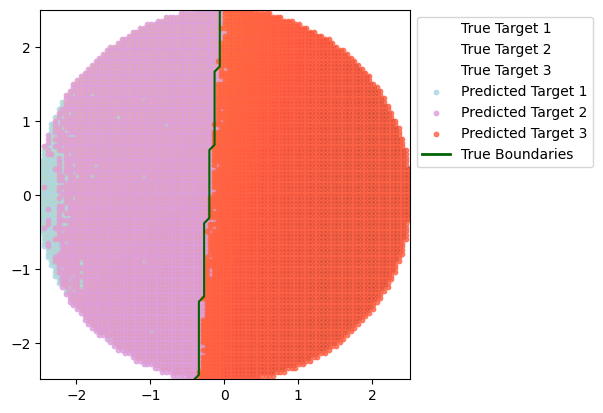

In [22]:
for i in range(50):
    plot_combined_targets_on_image_2(test_df_list[i], test_enhanced_images_T_list[i]) 